## Coverage Planning
As a matter of presenting a baseline, this notebook is used to develop coverage-planning algorithms (lawnmowers) of equivalent length to the typical myopic or nonmyopic planning regime presented in this notebook. 

In [45]:
# Imports
from matplotlib import pyplot as plt
import matplotlib
from matplotlib.colors import LogNorm
from matplotlib import cm
from sklearn import mixture
from IPython.display import display
from scipy.stats import multivariate_normal
import numpy as np
import scipy as sp
import math
import os
import GPy as GPy
import dubins
import time
from itertools import chain

In [46]:
%matplotlib inline
%load_ext autoreload
%aimport ipp_library
%autoreload 1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [49]:
from ipp_library import *

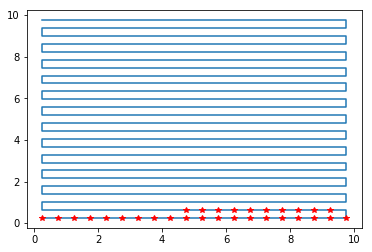

In [50]:
#defining the path to take
sample_step = 0.5
ranges = (0., 10., 0., 10.)
start = (0.25, 0.25, 0.0)
path_length = 1.5*175
coverage_path = [start]

across = 9.75
rise = 0.38
cp = start
waypoints = [cp]
l = 0

for i in range(0,51):
    if i%2 == 0:
        if cp[0] > ranges[1]/2:
            cp = (cp[0]-across+0.25, cp[1], cp[2])
            l += across
        else:
            cp = (cp[0]+across-0.25, cp[1], cp[2])
            l += across
    else:
        cp = (cp[0], cp[1]+rise, cp[2])
        l += rise
    waypoints.append(cp)

x = [w[0] for w in waypoints]
y = [w[1] for w in waypoints]

samples = [start]
extra = 0
addit = 0
last = start
for i,w in enumerate(waypoints):
    if i%4 == 0:
        last = w[0]
        while last+sample_step <= waypoints[i+1][0]:
            samples.append((last+sample_step, w[1], w[2])) 
            last = samples[-1][0]
        remainder = across-last
    elif (i+1)%4 == 0:
        last = waypoints[i-1][0]
        while last-sample_step+(remainder) >= waypoints[i][0]:
            samples.append((last-sample_step+(remainder), w[1], w[2])) 
            last = samples[-1][0]
        remainder = across-last

xs = [s[0] for s in samples]
ys = [s[1] for s in samples]

plt.plot(x, y)
plt.plot(xs[0:30], ys[0:30], 'r*')

Current environment in violation of boundary constraint. Regenerating!
Environment initialized with bounds X1: ( 0.0 , 10.0 )  X2:( 0.0 , 10.0 )
World max value 22.801464429649336 at location [1.57894737 9.47368421]


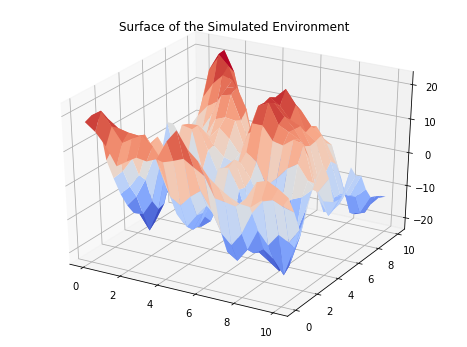

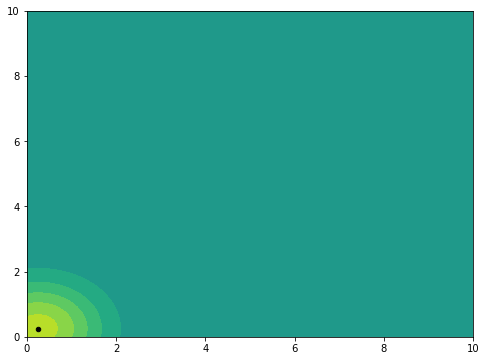

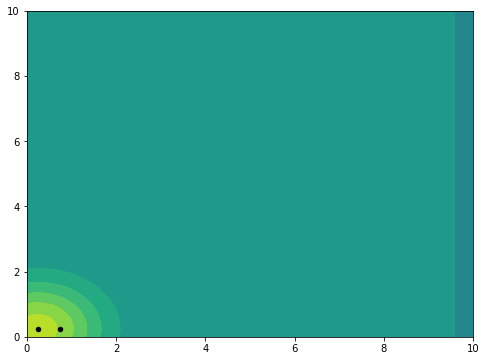

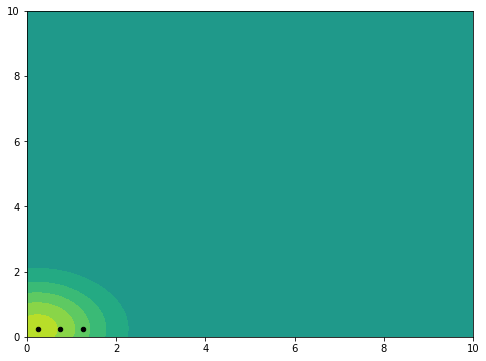

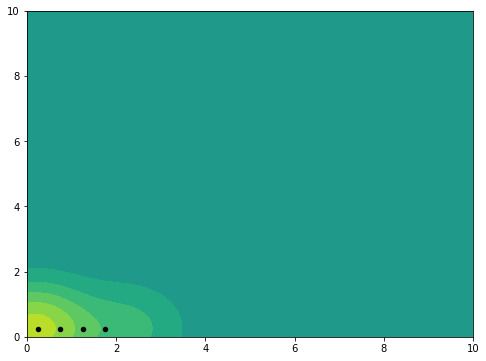

...

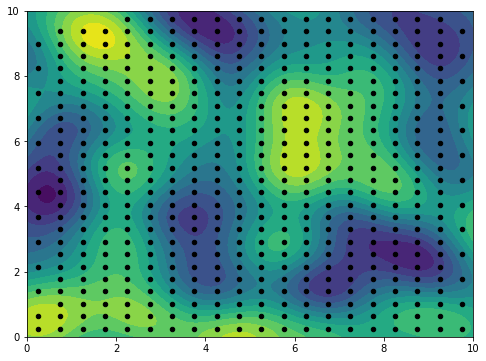

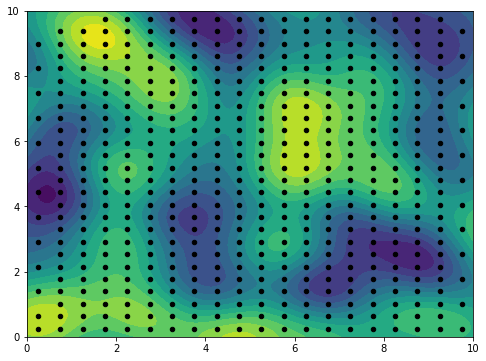

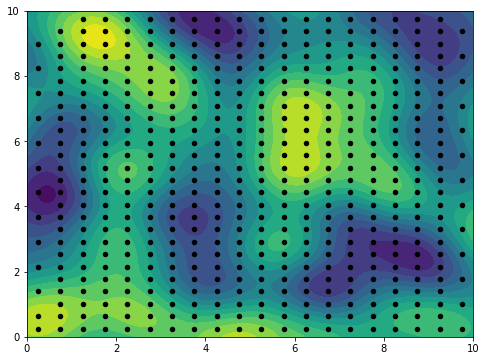

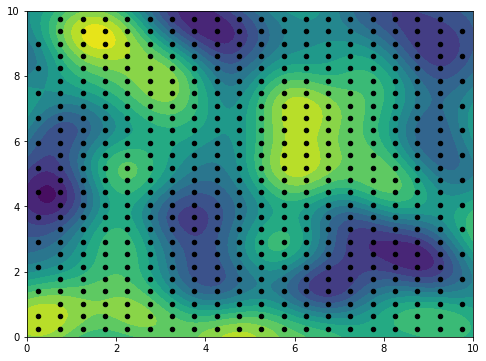

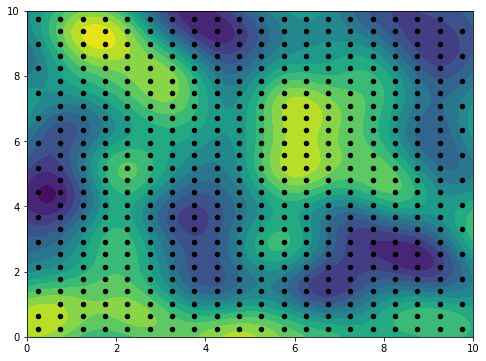

In [60]:
# Create a random enviroment sampled from a GP with an RBF kernel and specified hyperparameters, mean function 0 
# The enviorment will be constrained by a set of uniformly distributed  sample points of size NUM_PTS x NUM_PTS
''' Options include mean, info_gain, hotspot_info, exp_improve and mes'''
reward_function = 'mes'
ranges = (0., 10., 0., 10.)

world = Environment(ranges = ranges, # x1min, x1max, x2min, x2max constraints
                    NUM_PTS = 20, 
                    variance = 100.0, 
                    lengthscale = 1.0, 
                    visualize = True,
                    seed = 3)

evaluation = Evaluation(world = world, 
                        reward_function = reward_function)

# Gather some prior observations to train the kernel (optional)
x1observe = np.linspace(ranges[0], ranges[1], 8)
x2observe = np.linspace(ranges[2], ranges[3], 8)
x1observe, x2observe = np.meshgrid(x1observe, x2observe, sparse = False, indexing = 'xy')  
data = np.vstack([x1observe.ravel(), x2observe.ravel()]).T
observations = world.sample_value(data)

# for each point in the path of the world, query for an observation, use that observation to update the GP, and
# continue. log everything to make comparisons.
# robot model
rob_mod = GPModel(ranges = ranges, lengthscale = 1.0, variance = 100.0)

#plotting params
x1vals = np.linspace(ranges[0], ranges[1], 100)
x2vals = np.linspace(ranges[2], ranges[3], 100)
x1, x2 = np.meshgrid(x1vals, x2vals, sparse = False, indexing = 'xy') 
data = np.vstack([x1.ravel(), x2.ravel()]).T

for p in samples:
    xobs = np.vstack([p[0], p[1]]).T
    zobs = world.sample_value(xobs)
    rob_mod.add_data(xobs, zobs)
    observations, var = rob_mod.predict_value(data)  
     # Plot the current robot model of the world
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.set_xlim(ranges[0:2])
    ax.set_ylim(ranges[2:])
    plot = ax.contourf(x1, x2, observations.reshape(x1.shape), cmap = 'viridis', vmin = -25, vmax = 25, levels=np.linspace(-25, 25, 15))
    if rob_mod.xvals is not None:
        scatter = ax.scatter(rob_mod.xvals[:, 0], rob_mod.xvals[:, 1], c='k', s = 20.0, cmap = 'viridis')
plt.show()

    